In [12]:
import platform
from pathlib import Path

BIN_MAPS = {"Darwin": "mac", "Linux": "linux"}

try:
    import google.colab

    ! pip install pandas scikit-learn scikit-image statsmodels requests
    ! [[ -d image-crop-analysis ]] || git clone https://github.com/twitter-research/image-crop-analysis.git
    ! [[ -d stylegan2-ada ]] || git clone https://github.com/NVlabs/stylegan2-ada.git
    !wget http://d36zk2xti64re0.cloudfront.net/stylegan2/networks/stylegan2-ffhq-config-f.pkl

    EXT_DIR = Path(".")
    DATA_DIR = Path(".")

except ImportError:
    import warnings
    warnings.warn("The notebook was only tested using Google's Colab.")
    
!mkdir -p .tmp

--2021-08-07 02:18:36--  http://d36zk2xti64re0.cloudfront.net/stylegan2/networks/stylegan2-ffhq-config-f.pkl
Resolving d36zk2xti64re0.cloudfront.net (d36zk2xti64re0.cloudfront.net)... 13.224.2.108, 13.224.2.194, 13.224.2.149, ...
Connecting to d36zk2xti64re0.cloudfront.net (d36zk2xti64re0.cloudfront.net)|13.224.2.108|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381673535 (364M) [application/x-www-form-urlencoded]
Saving to: ‘stylegan2-ffhq-config-f.pkl.1’

stylegan2-ffhq-conf 100%[===================>] 363.99M   214MB/s    in 1.7s    

2021-08-07 02:18:39 (214 MB/s) - ‘stylegan2-ffhq-config-f.pkl.1’ saved [381673535/381673535]



In [13]:
CROP_BASE = EXT_DIR / Path("image-crop-analysis")
CROP_BIN_PATH = CROP_BASE / "bin" / BIN_MAPS[platform.system()] / "candidate_crops"
CROP_MODEL_PATH = CROP_BASE / "bin/fastgaze.vxm"
STYLEGAN_PATH = EXT_DIR / Path("stylegan2-ada")
TMP_DIR = Path(".tmp")

In [14]:
import os
import sys
sys.path.append(str(EXT_DIR / "image-crop-analysis/src"))
sys.path.append(str(STYLEGAN_PATH))

In [15]:
%tensorflow_version 1.x
import re
import random
import imageio
import tempfile
import itertools
import collections

import torch
import seaborn as sns
import numpy as np
import pandas as pd

from dataclasses import dataclass
from joblib import Parallel, delayed
from IPython.display import display
from PIL import Image, ImageDraw
from scipy.misc import face
from scipy.ndimage import zoom
from scipy.special import logsumexp
from scipy.special import expit
from matplotlib import pyplot as plt

from crop_api import ImageSaliencyModel, is_symmetric, parse_output, reservoir_sampling
from image_manipulation import join_images, process_image

# StyleGAN
import pickle
import dnnlib
import dnnlib.tflib as tflib
from io import BytesIO
from math import ceil
import imageio

Load StyleGAN-2 for generating images of faces.

In [16]:
dnnlib.tflib.init_tf()
network_pkl = 'stylegan2-ffhq-config-f.pkl'
 
print('Loading networks from "%s"...' % network_pkl)
with dnnlib.util.open_url(network_pkl) as fp:
    _G, _D, Gs = pickle.load(fp)
noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

Loading networks from "stylegan2-ffhq-config-f.pkl"...


Utilities for using StyleGAN. 

In [17]:
# Based on https://colab.research.google.com/github/Hephyrius/Stylegan2-Ada-Google-Colab-Starter-Notebook/blob/main/Stylegan2_Ada_Colab_Starter.ipynb
def generate_zs_from_seeds(seeds):
    zs = []
    for seed_idx, seed in enumerate(seeds):
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
        zs.append(z)
    return zs

def generate_images(zs, truncation_psi, as_array=False):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    if not isinstance(truncation_psi, list):
        truncation_psi = [truncation_psi] * len(zs)
        
    imgs = []
    for z_idx, z in enumerate(zs):
        Gs_kwargs.truncation_psi = truncation_psi[z_idx]
        noise_rnd = np.random.RandomState(1) # fix noise
        tflib.set_vars({var: noise_rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]
        images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
        imgs.append(Image.fromarray(images[0], 'RGB') if as_array else images[0])
    return imgs

To select the test images, I generate a bunch of faces, and manually pick some in order to have images of people with diverse attributes. By diverse I do not only mean the classical sense considered in fairness literature such as race and gender presentation, but also things like glasses, hairstyle and hair color.

Ironically, by randomly sampling from the StyleGAN-2 model, it is extremely rare that we get images appearing as (a) elderly people, and (b) black men. Yet, biases of the StyleGAN-2 model is out of scope for now...



0


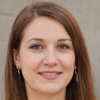

1


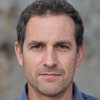

2


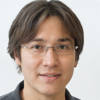

3


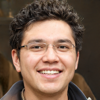

4


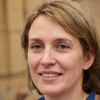

In [18]:
seed_range = (0, 5)
for i in range(*seed_range):
  print(i)
  z = generate_zs_from_seeds([i])[0]
  display(Image.fromarray(generate_images([z], truncation_psi=0.5)[0], "RGB").resize((100, 100)))

Initialize the Twitter saliency model.

In [19]:
twitter_saliency_model = ImageSaliencyModel(
    crop_binary_path=CROP_BIN_PATH,
    crop_model_path=CROP_MODEL_PATH,
)

def get_twitter_max_saliency(imagearray):
    with tempfile.NamedTemporaryFile("w+b", dir=TMP_DIR) as fp:
        Image.fromarray(imagearray).save(fp, "JPEG")
        salient_points = np.array(twitter_saliency_model.get_output(Path(fp.name))["all_salient_points"])
        return salient_points[:, 2].max()

The random search algorithm, described in the README.

In [23]:
def get_saliency_scores(zs):
  image_arrays = generate_images(zs, truncation_psi=0.5, as_array=False)
  scores = []
  for image_array in image_arrays:
    max_saliency = get_twitter_max_saliency(image_array)
    scores.append(max_saliency)
  return np.array(scores), image_arrays


def random_search(
    init_z,              # Initial latent space vector.
    beam_size=10,        # Number of candidate modifications per iteration.
    delta=0.1,           # Noise parameter for sampled modifications.
    num_steps=10,        # Number of iterations.
    seed=0,              # Seed for sampling modifications.
    verbose=True,        # Whether to show intermediate results.
    track_history=True   # Whether to return the intermediate results.
):
  num_dims = Gs.input_shape[1:][0]

  current_z = init_z
  scores, image_arrays = get_saliency_scores([current_z])
  best_index = 0
  if track_history:
    history = []
  prng = np.random.RandomState(seed)

  for t in range(num_steps):
    best_image = Image.fromarray(image_arrays[best_index], "RGB")
    history.append((scores[best_index], best_image))
    if verbose:
      print("step:", t, "/ score:", scores.max())
      display(best_image.resize((100, 100)))

    zs = [current_z]
    for i in range(beam_size):
      zs.append(current_z + prng.multivariate_normal([0] * num_dims, delta * np.eye(num_dims)))

    scores, image_arrays = get_saliency_scores(zs)
    best_index = scores.argmax()
    current_z = zs[best_index]

  if verbose:
    print("step:", t, "/ score:", scores.max())
  final_image = generate_images([current_z], truncation_psi=0.5)[0]
  return (final_image, history) if track_history else final_image

## The closes thing to a "unit test".
# init_z = generate_zs_from_seeds([116])[0]
# image, history = random_search(
#     init_z, delta=0.02, beam_size=5, num_steps=5, seed=1)
# display(Image.fromarray(np.hstack([history[0][1], image]), "RGB").resize((200, 100)))

In [24]:
seeds_data = {}

seed: 155
step: 0 / score: 3.55008


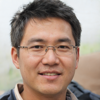

step: 1 / score: 3.80212


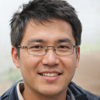

step: 2 / score: 4.21941


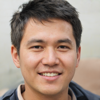

step: 3 / score: 4.42995


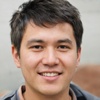

step: 4 / score: 4.79404


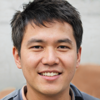

step: 4 / score: 5.05001
transition:


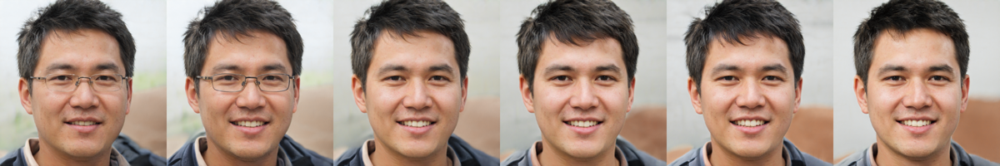

seed: 162
step: 0 / score: 4.88293


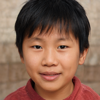

step: 1 / score: 5.31101


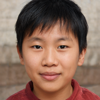

step: 2 / score: 5.4916


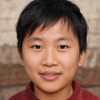

step: 3 / score: 5.71462


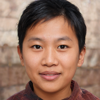

step: 4 / score: 5.90511


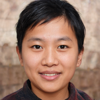

step: 4 / score: 6.00409
transition:


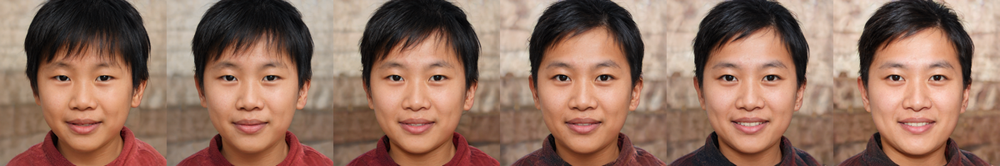

seed: 154
step: 0 / score: 4.16271


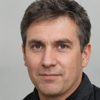

step: 1 / score: 4.55625


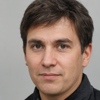

step: 2 / score: 5.03679


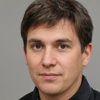

step: 3 / score: 5.03679


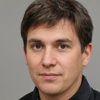

step: 4 / score: 5.12822


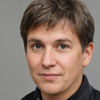

step: 4 / score: 5.12824
transition:


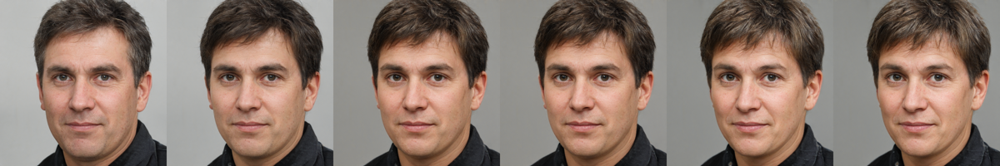

seed: 116
step: 0 / score: 4.24521


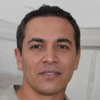

step: 1 / score: 4.53072


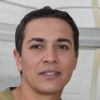

step: 2 / score: 4.70493


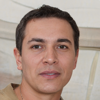

step: 3 / score: 4.74338


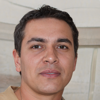

step: 4 / score: 4.9178


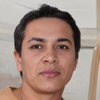

step: 4 / score: 5.10497
transition:


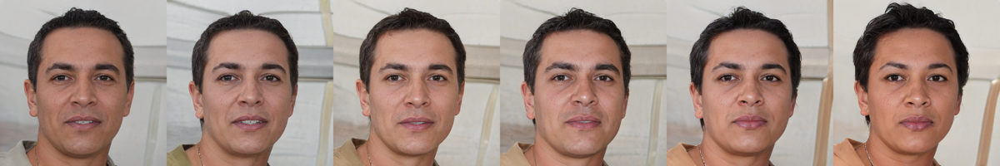

seed: 491
step: 0 / score: 4.21016


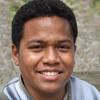

step: 1 / score: 4.64753


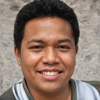

step: 2 / score: 4.89488


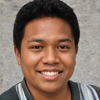

step: 3 / score: 5.18358


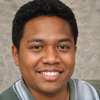

step: 4 / score: 5.40495


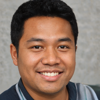

step: 4 / score: 5.57514
transition:


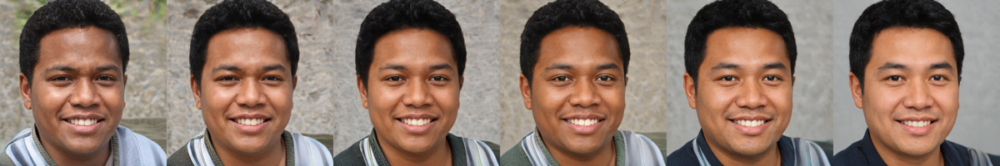

seed: 489
step: 0 / score: 4.7841


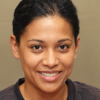

step: 1 / score: 4.989


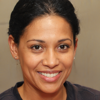

step: 2 / score: 5.12962


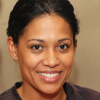

step: 3 / score: 5.21592


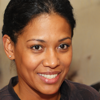

step: 4 / score: 5.42593


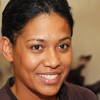

step: 4 / score: 5.51479
transition:


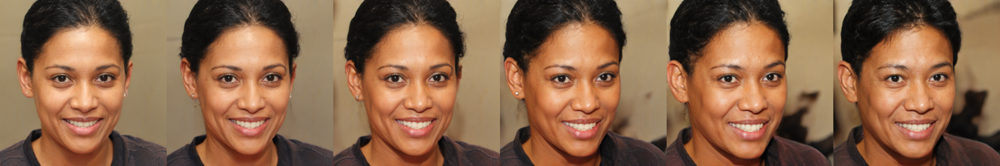

seed: 492
step: 0 / score: 4.05032


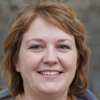

step: 1 / score: 4.3689


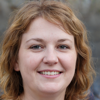

step: 2 / score: 4.79999


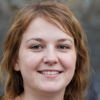

step: 3 / score: 5.00533


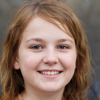

step: 4 / score: 5.20674


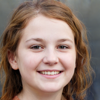

step: 4 / score: 5.4831
transition:


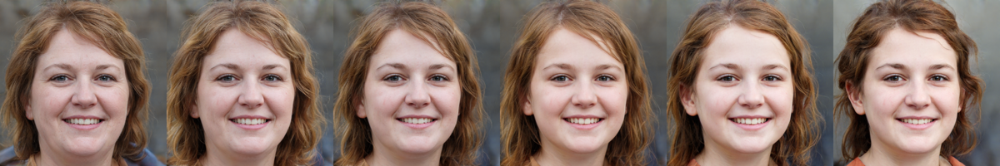

seed: 355
step: 0 / score: 4.28626


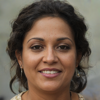

step: 1 / score: 4.58384


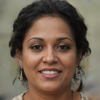

step: 2 / score: 4.78983


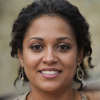

step: 3 / score: 4.93276


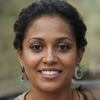

step: 4 / score: 5.0953


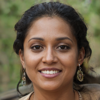

step: 4 / score: 5.10791
transition:


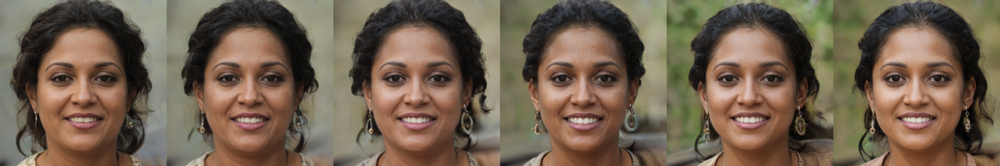

seed: 356
step: 0 / score: 5.01718


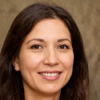

step: 1 / score: 5.29629


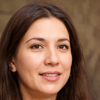

step: 2 / score: 5.88918


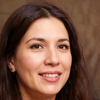

step: 3 / score: 6.09453


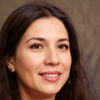

step: 4 / score: 6.09428


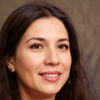

step: 4 / score: 6.17397
transition:


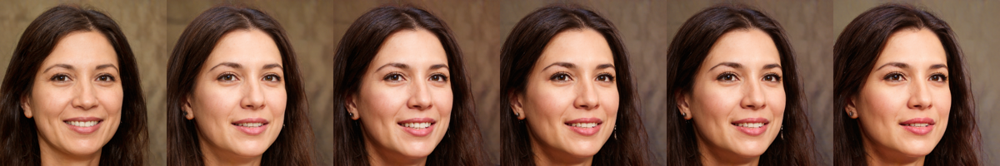

seed: 372
step: 0 / score: 4.3722


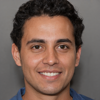

step: 1 / score: 5.04198


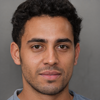

step: 2 / score: 5.335


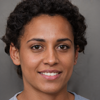

step: 3 / score: 5.47959


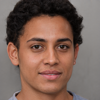

step: 4 / score: 5.56736


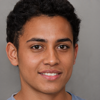

step: 4 / score: 5.64717
transition:


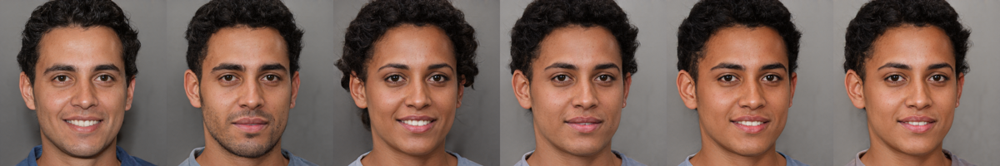

seed: 387
step: 0 / score: 3.70495


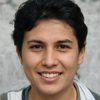

step: 1 / score: 4.43773


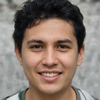

step: 2 / score: 4.43779


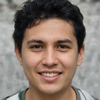

step: 3 / score: 4.59705


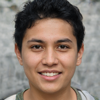

step: 4 / score: 5.13778


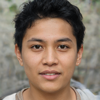

step: 4 / score: 5.3969
transition:


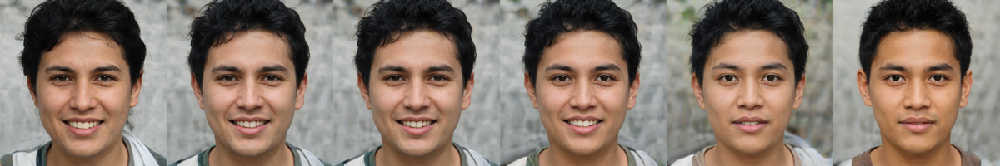

seed: 388
step: 0 / score: 2.81326


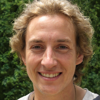

step: 1 / score: 3.34071


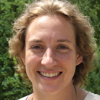

step: 2 / score: 4.00433


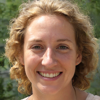

step: 3 / score: 4.07871


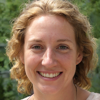

step: 4 / score: 4.24523


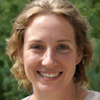

step: 4 / score: 4.49873
transition:


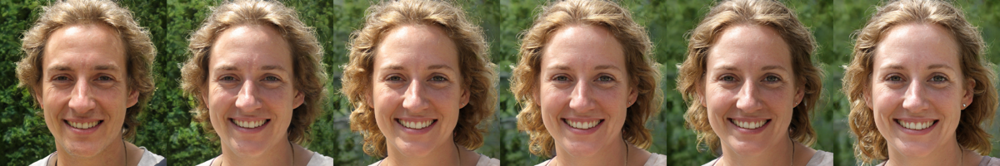

seed: 450
step: 0 / score: 5.43354


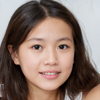

step: 1 / score: 5.73635


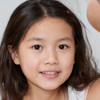

step: 2 / score: 5.79257


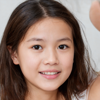

step: 3 / score: 5.85341


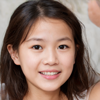

step: 4 / score: 6.05957


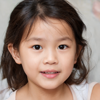

step: 4 / score: 6.09186
transition:


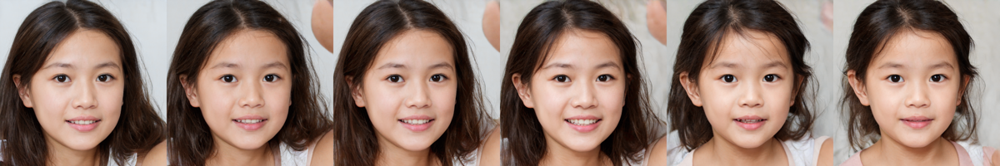

seed: 374
step: 0 / score: 3.70005


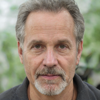

step: 1 / score: 3.95884


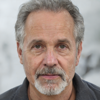

step: 2 / score: 4.20064


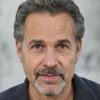

step: 3 / score: 4.53216


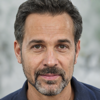

step: 4 / score: 4.98631


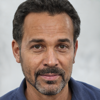

step: 4 / score: 5.1744
transition:


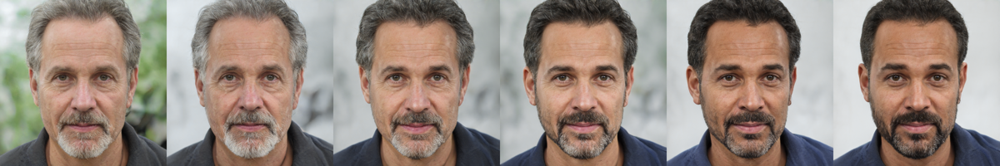

seed: 368
step: 0 / score: 4.88311


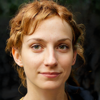

step: 1 / score: 5.30293


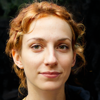

step: 2 / score: 5.3959


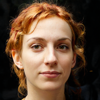

step: 3 / score: 5.72695


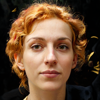

step: 4 / score: 6.04055


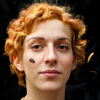

step: 4 / score: 6.35104
transition:


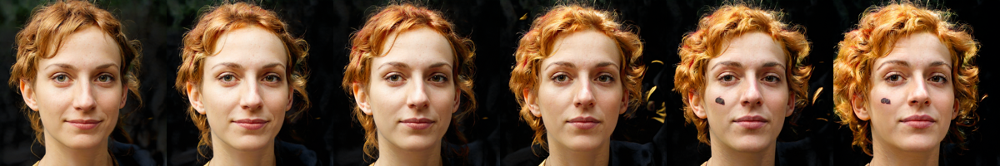

seed: 1407
step: 0 / score: 4.70668


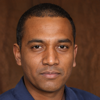

step: 1 / score: 5.46445


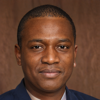

step: 2 / score: 5.48083


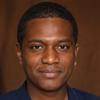

step: 3 / score: 5.52399


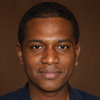

step: 4 / score: 5.77214


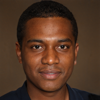

step: 4 / score: 5.85434
transition:


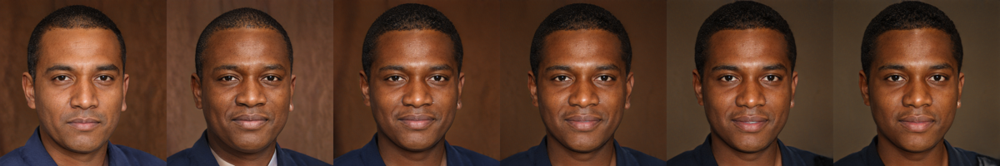

In [25]:
seeds = [
  155,
  162,
  154,
  116,
  491,
  489,
  492,
  355,
  356,
  372,
  387,
  388,
  450,
  374,
  368,
  1407
]
search_params = dict(
  delta=0.04, beam_size=20, num_steps=5, seed=0
)
display_size = 200

for seed in seeds:
  print("seed:", seed)
  init_z = generate_zs_from_seeds([seed])[0]
  image, history = random_search(init_z, **search_params)

  print("transition:")
  image_history = [np.array(old_img) for score, old_img in history] + [image]
  transition = Image.fromarray(np.hstack(image_history), "RGB")
  display(transition.resize((display_size * len(image_history), display_size)))
  seeds_data[seed] = (image, history)

In [28]:
with open("seeds_data.pkl", "wb") as f:
  pickle.dump(seeds_data, f)

Saliency increase: 3.5501 → 4.7940 (135.04%)


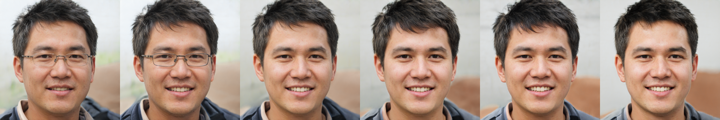

Saliency increase: 4.8829 → 5.9051 (120.93%)


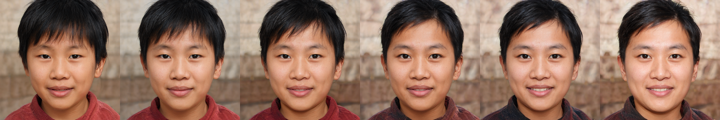

Saliency increase: 4.1627 → 5.1282 (123.19%)


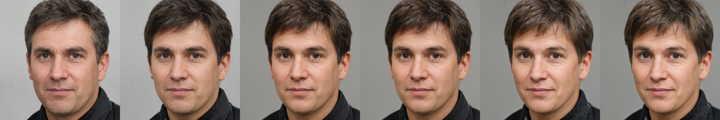

Saliency increase: 4.2452 → 4.9178 (115.84%)


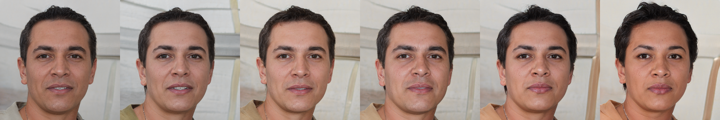

Saliency increase: 4.2102 → 5.4050 (128.38%)


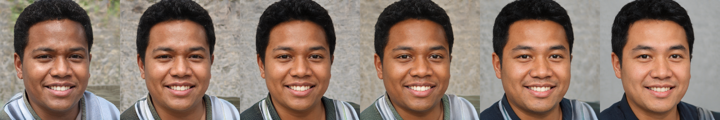

Saliency increase: 4.7841 → 5.4259 (113.42%)


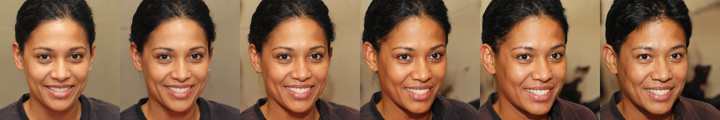

Saliency increase: 4.0503 → 5.2067 (128.55%)


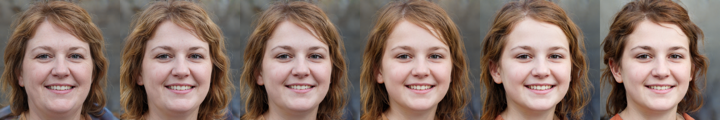

Saliency increase: 4.2863 → 5.0953 (118.88%)


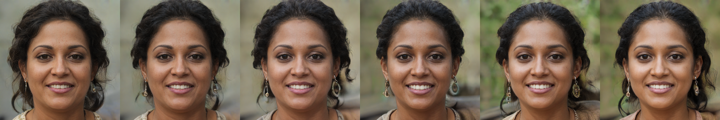

Saliency increase: 5.0172 → 6.0943 (121.47%)


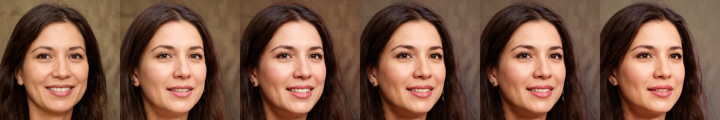

Saliency increase: 4.3722 → 5.5674 (127.34%)


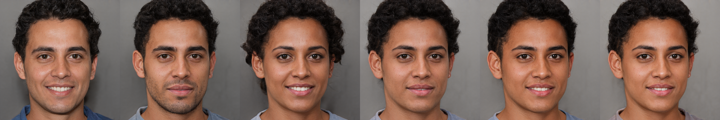

Saliency increase: 3.7050 → 5.1378 (138.67%)


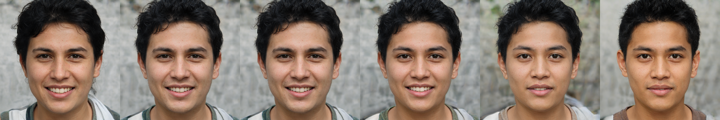

Saliency increase: 2.8133 → 4.2452 (150.90%)


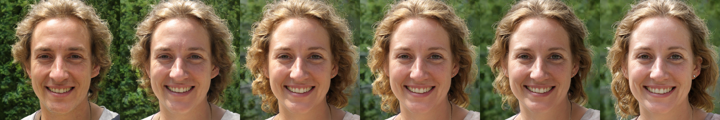

Saliency increase: 5.4335 → 6.0596 (111.52%)


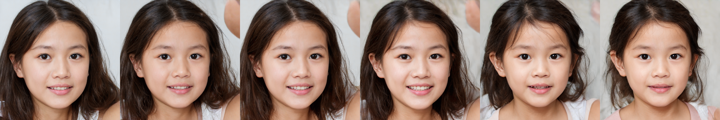

Saliency increase: 3.7001 → 4.9863 (134.76%)


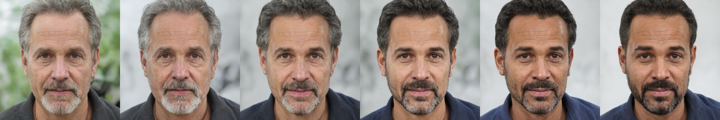

Saliency increase: 4.8831 → 6.0405 (123.70%)


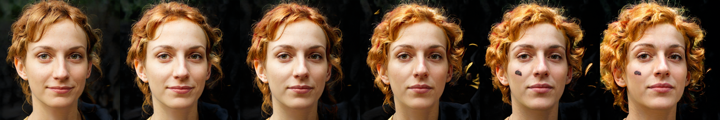

Saliency increase: 4.7067 → 5.7721 (122.64%)


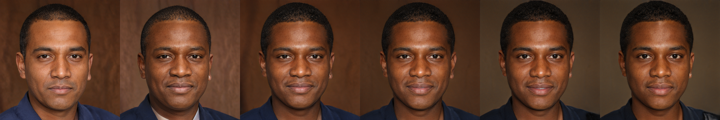

In [49]:
display_size = 120
for i, seed in enumerate(seeds_data):
  image, history = seeds_data[seed]
  image_history = [np.array(old_img) for score, old_img in history] + [image]
  transition = Image.fromarray(np.hstack(image_history), "RGB")
  
  scores = [s for s, _ in history]
  print("Saliency increase: {:.4f} → {:.4f} ({:.2f}%)".format(
      scores[0], scores[-1], scores[-1] / scores[0] * 100))
  display(transition.resize((display_size * len(image_history), display_size)))
  

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


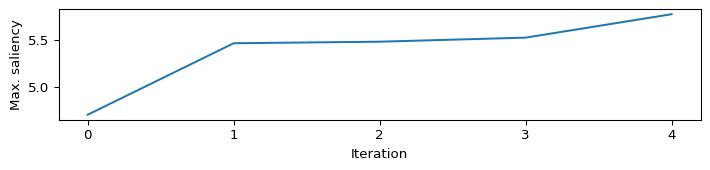

In [44]:
dpi = 96
width = len(image_history) * display_size
fig, ax = plt.subplots(figsize=(width/dpi, 1.5 * display_size/dpi), dpi=dpi)
ax.set_ylabel("Max. saliency")
ax.set_xlabel("Iteration")
ax.set_xticks([0, 1, 2, 3, 4, 5])
sns.lineplot(range(len(scores)), scores, ax=ax)
fig.set_tight_layout(tight=True)